#### 0.5

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats
import seaborn
import numpy as np

pd.options.display.max_rows = 100

In [3]:
train = pd.read_csv("merged_file.csv")

kontinuirane_varijable = []
kategoricke_varijable = []
sva_svojstva = train.columns.tolist()

for prop in sva_svojstva:
    value = train.loc[~train[prop].isnull(), prop].iloc[0]
    if(isinstance(value, str)):
        kategoricke_varijable.append(prop)
    else:
        kontinuirane_varijable.append(prop)

print(f"kontinuirane_varijable > {kontinuirane_varijable}")
print(f"kategoricke_varijable > {kategoricke_varijable}")

kontinuirane_varijable > ['number_of_elements', 'mean_atomic_mass', 'wtd_mean_atomic_mass', 'gmean_atomic_mass', 'wtd_gmean_atomic_mass', 'entropy_atomic_mass', 'wtd_entropy_atomic_mass', 'range_atomic_mass', 'wtd_range_atomic_mass', 'std_atomic_mass', 'wtd_std_atomic_mass', 'mean_fie', 'wtd_mean_fie', 'gmean_fie', 'wtd_gmean_fie', 'entropy_fie', 'wtd_entropy_fie', 'range_fie', 'wtd_range_fie', 'std_fie', 'wtd_std_fie', 'mean_atomic_radius', 'wtd_mean_atomic_radius', 'gmean_atomic_radius', 'wtd_gmean_atomic_radius', 'entropy_atomic_radius', 'wtd_entropy_atomic_radius', 'range_atomic_radius', 'wtd_range_atomic_radius', 'std_atomic_radius', 'wtd_std_atomic_radius', 'mean_Density', 'wtd_mean_Density', 'gmean_Density', 'wtd_gmean_Density', 'entropy_Density', 'wtd_entropy_Density', 'range_Density', 'wtd_range_Density', 'std_Density', 'wtd_std_Density', 'mean_ElectronAffinity', 'wtd_mean_ElectronAffinity', 'gmean_ElectronAffinity', 'wtd_gmean_ElectronAffinity', 'entropy_ElectronAffinity', 'w

#### 1.1

In [110]:
train.isnull().sum()

number_of_elements                 0
mean_atomic_mass                   0
wtd_mean_atomic_mass               0
gmean_atomic_mass                  0
wtd_gmean_atomic_mass              0
entropy_atomic_mass                0
wtd_entropy_atomic_mass            0
range_atomic_mass                  0
wtd_range_atomic_mass              0
std_atomic_mass                    0
wtd_std_atomic_mass                0
mean_fie                           0
wtd_mean_fie                       0
gmean_fie                          0
wtd_gmean_fie                      0
entropy_fie                        0
wtd_entropy_fie                    0
range_fie                          0
wtd_range_fie                      0
std_fie                            0
wtd_std_fie                        0
mean_atomic_radius                 0
wtd_mean_atomic_radius             0
gmean_atomic_radius                0
wtd_gmean_atomic_radius            0
entropy_atomic_radius              0
wtd_entropy_atomic_radius          0
r

#### 1.2

In [111]:
train.fillna("nema", inplace=True)

#### 1.3

C:\Users\Korisnik\AppData\Local\Temp\ipykernel_14096\2862918729.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


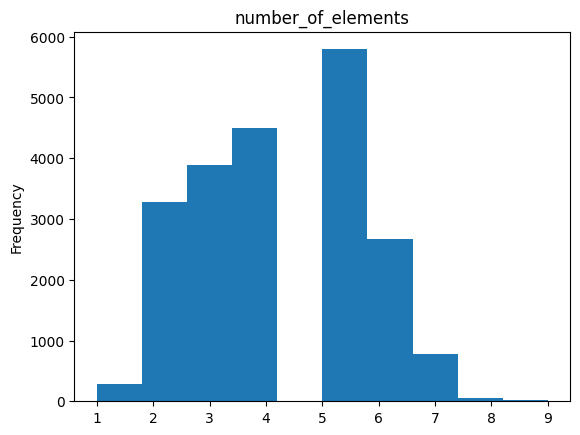

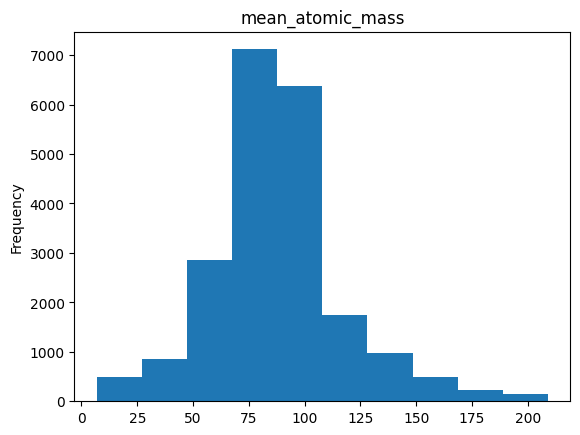

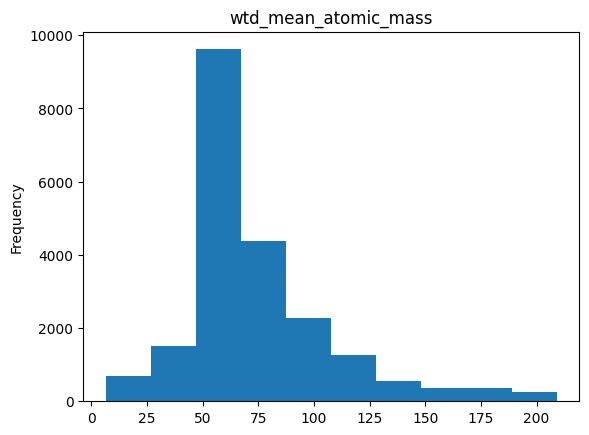

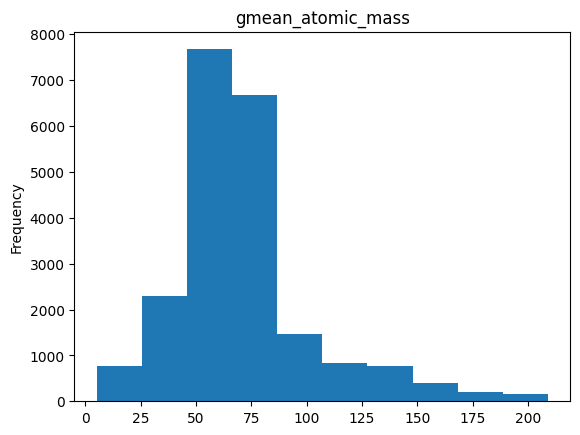

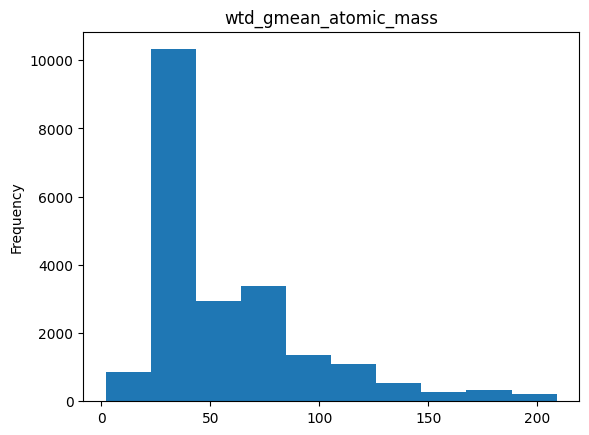

...

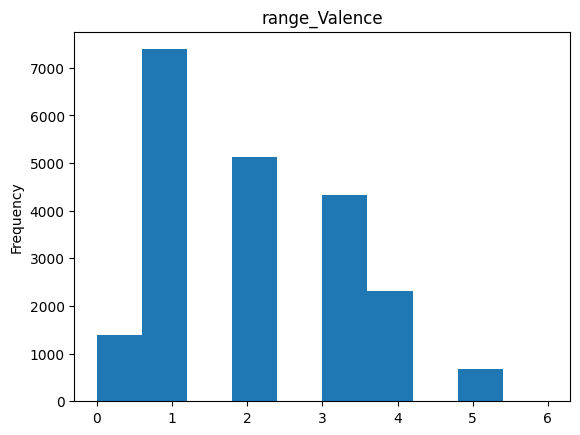

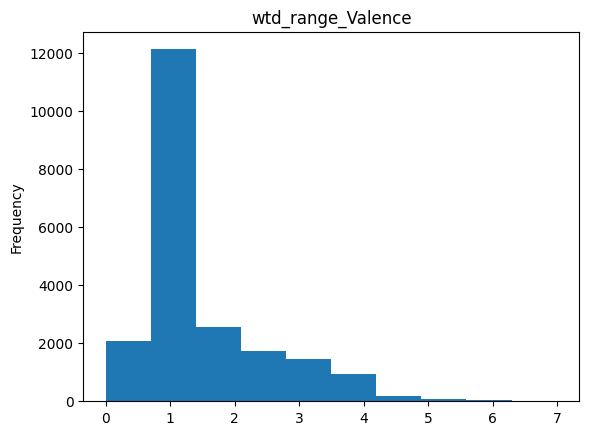

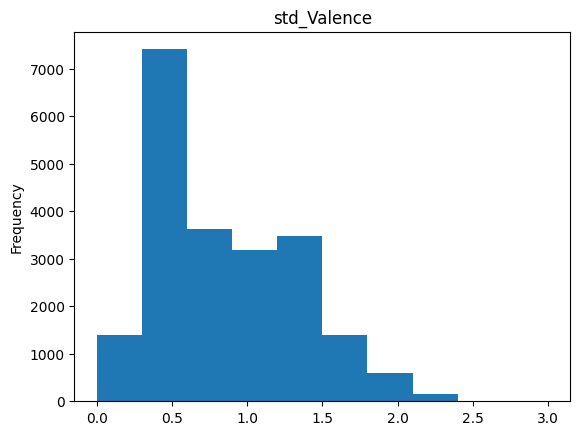

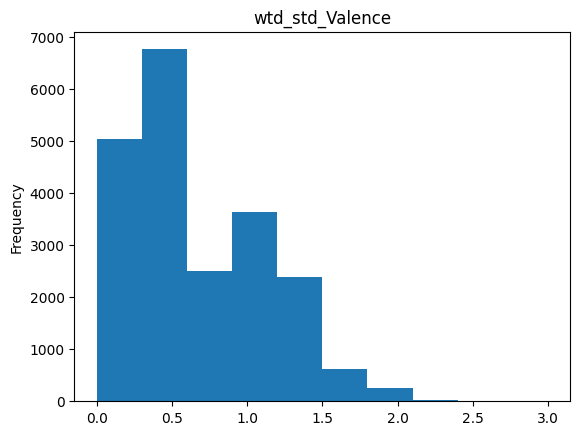

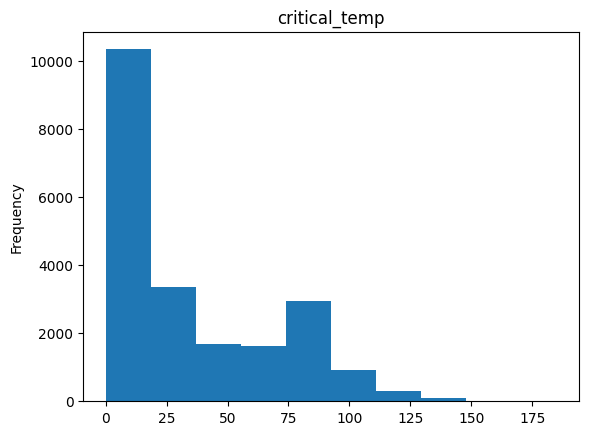

In [112]:
for col in kontinuirane_varijable:
  plt.figure()
  train[col].plot(kind="hist", title=col)

#### 1.4

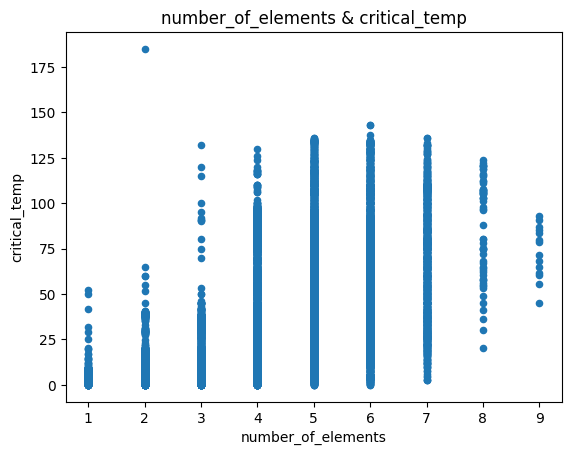

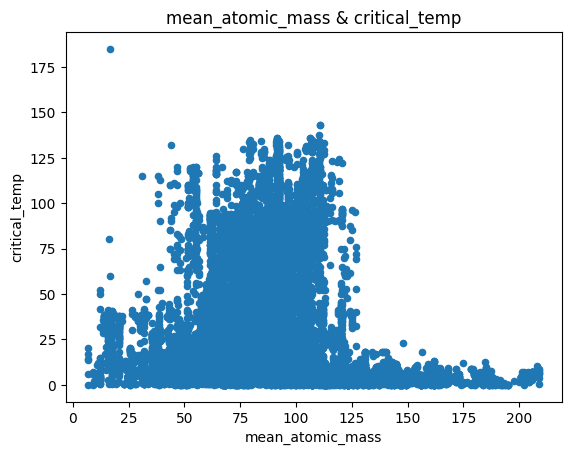

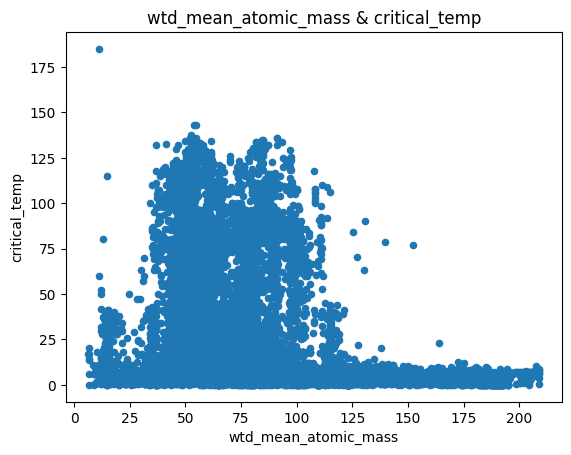

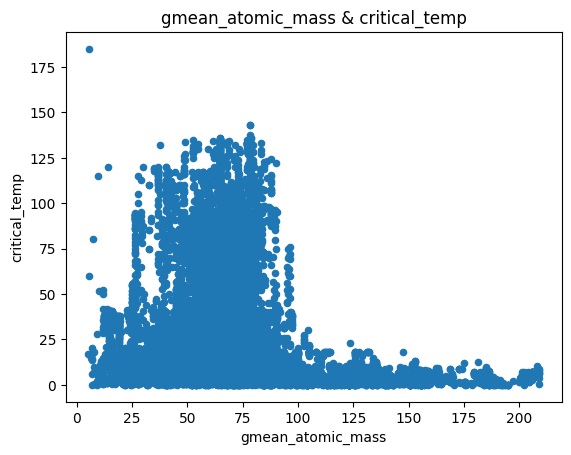

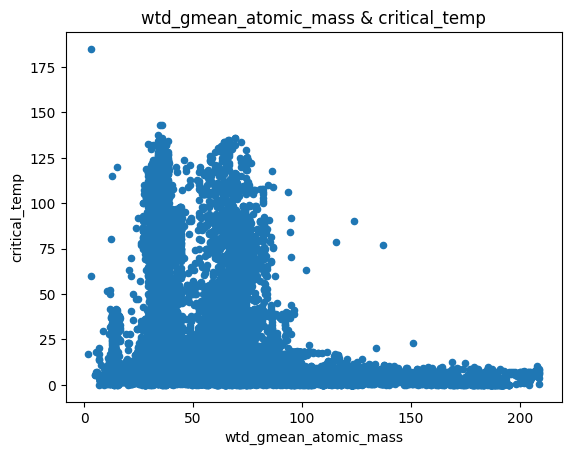

...

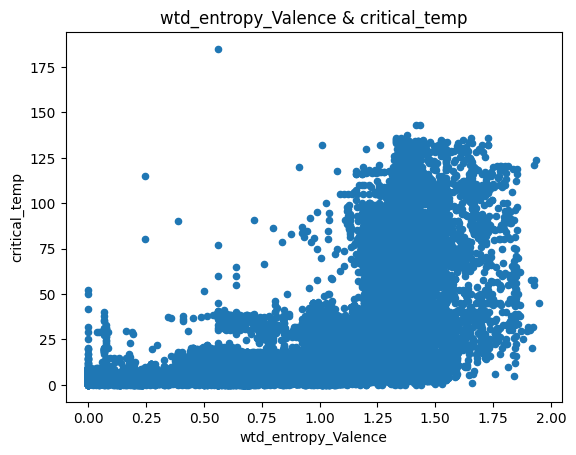

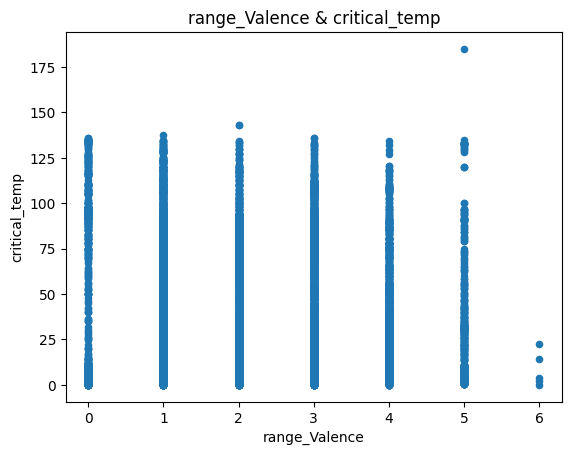

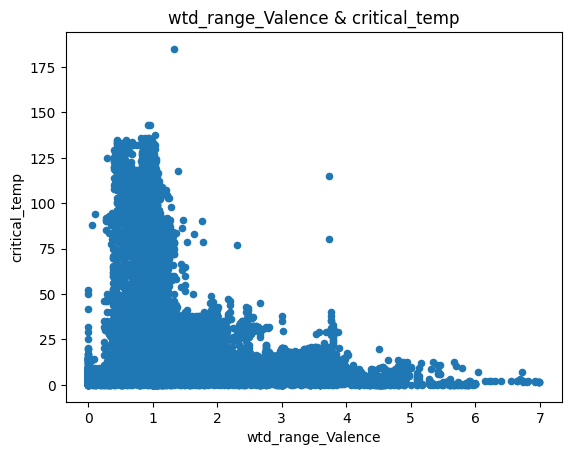

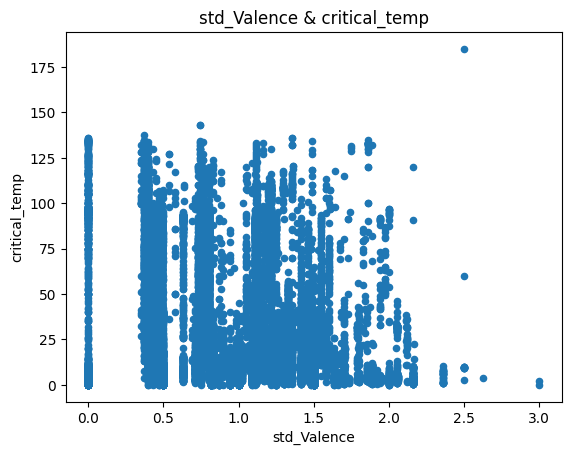

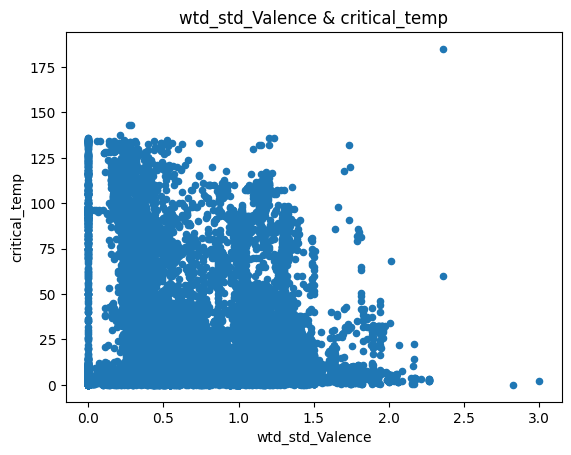

In [4]:
ciljna_varijabla = "critical_temp"

kontinuirane_varijable_bez_ciljne = kontinuirane_varijable[:]
kontinuirane_varijable_bez_ciljne.remove(ciljna_varijabla)

for svojstvo in kontinuirane_varijable_bez_ciljne:
    train.plot(kind = "scatter", x = svojstvo, y = ciljna_varijabla)
    plt.title(svojstvo + " & " + ciljna_varijabla)
    plt.show()

#### 1.5 Komentiranje

#### 2.1

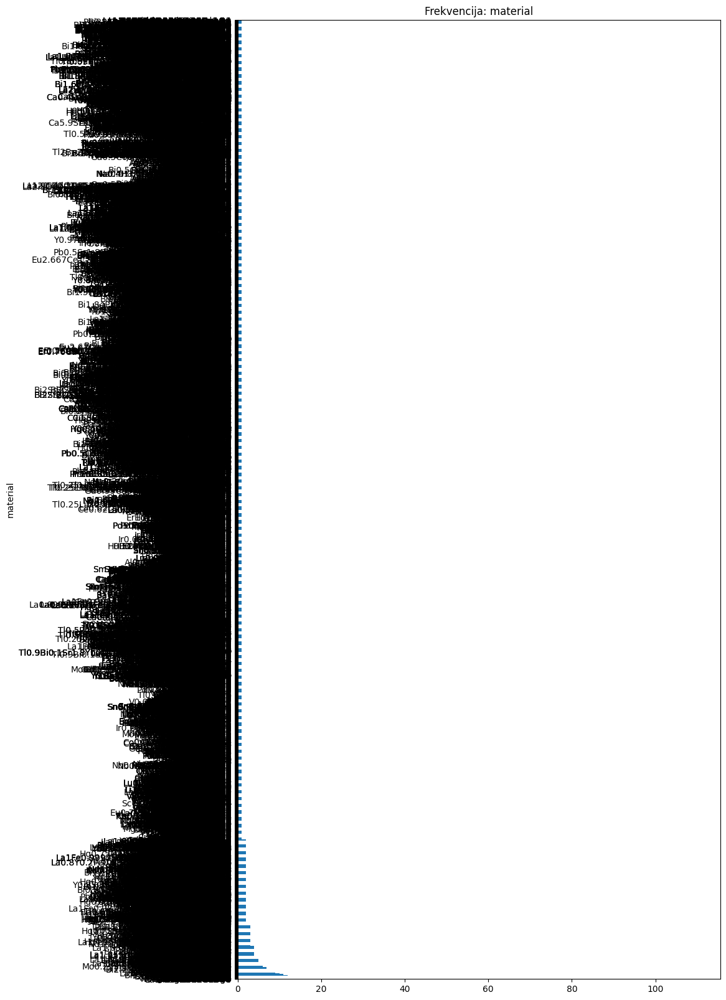

In [114]:
for col in kategoricke_varijable:
  plt.figure()

  plot_size = (10, 20) if train[col].nunique() > 20 else (5, 5)

  train.loc[:, col].value_counts().plot(
      kind="barh", title=f"Frekvencija: {col}", figsize=plot_size)

#### 2.2

In [45]:
for col in kontinuirane_varijable:
  var = train[col]
  avg =  var.mean()
  z_val = stats.zscore(var)
  nagnutost = stats.skew(var)
  zaobljenost = stats.kurtosis(var)

  print("-------------------------------------")
  print(f"Naziv varijable: {col}")
  print(f"Srednja vrijednost: {avg}")
  print(f"Z vrijednost: {z_val[0]}")
  print(f"Nagnutost distribucije: {nagnutost}")
  print(f"Zaobljenost distribucije: {zaobljenost}")

-------------------------------------
Naziv varijable: number_of_elements
Srednja vrijednost: 4.115223627898227
Z vrijednost: -0.08005750407672019
Nagnutost distribucije: 0.009214795201550673
Zaobljenost distribucije: -0.6853603857766966
-------------------------------------
Naziv varijable: mean_atomic_mass
Srednja vrijednost: 87.55763086475905
Z vrijednost: 0.04673291580313684
Nagnutost distribucije: 0.7746263382070084
Zaobljenost distribucije: 2.0559512411799163
-------------------------------------
Naziv varijable: wtd_mean_atomic_mass
Srednja vrijednost: 72.98831044307747
Z vrijednost: -0.45165095190857085
Nagnutost distribucije: 1.5038005574609372
Zaobljenost distribucije: 2.829772685988349
-------------------------------------
Naziv varijable: gmean_atomic_mass
Srednja vrijednost: 71.29062703770029
Z vrijednost: -0.1588497376994535
Nagnutost distribucije: 1.4747116734316366
Zaobljenost distribucije: 3.3266968167088597
-------------------------------------
Naziv varijable: wtd_gm

#### 2.3

In [56]:
print(train.corr(numeric_only=True)[ciljna_varijabla])

number_of_elements                 0.601069
mean_atomic_mass                  -0.113523
wtd_mean_atomic_mass              -0.312272
gmean_atomic_mass                 -0.230345
wtd_gmean_atomic_mass             -0.369858
entropy_atomic_mass                0.543619
wtd_entropy_atomic_mass            0.626930
range_atomic_mass                  0.491970
wtd_range_atomic_mass             -0.337131
std_atomic_mass                    0.378766
wtd_std_atomic_mass                0.359306
mean_fie                           0.102268
wtd_mean_fie                       0.398796
gmean_fie                         -0.025103
wtd_gmean_fie                      0.343747
entropy_fie                        0.567817
wtd_entropy_fie                    0.388359
range_fie                          0.600790
wtd_range_fie                      0.300482
std_fie                            0.541804
wtd_std_fie                        0.582013
mean_atomic_radius                 0.105273
wtd_mean_atomic_radius          

c:\Users\Korisnik\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\axisgrid.py:453: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


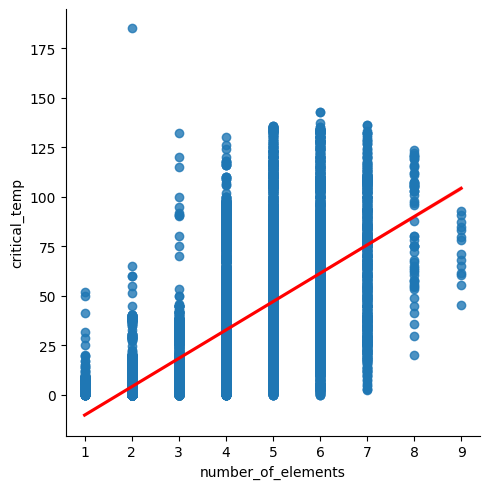

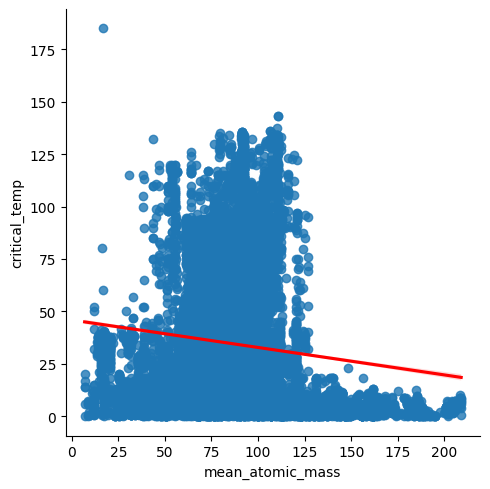

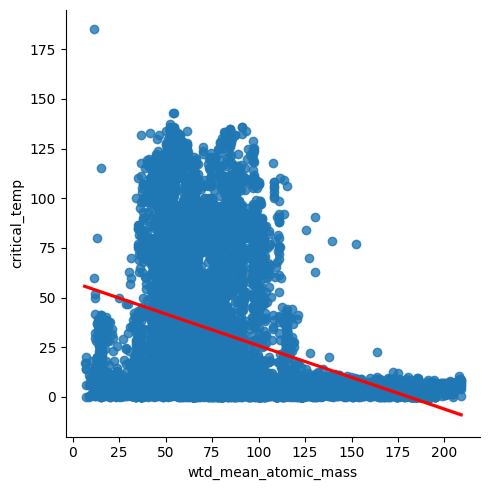

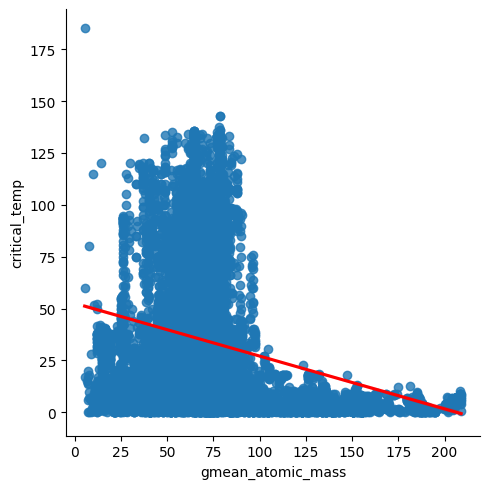

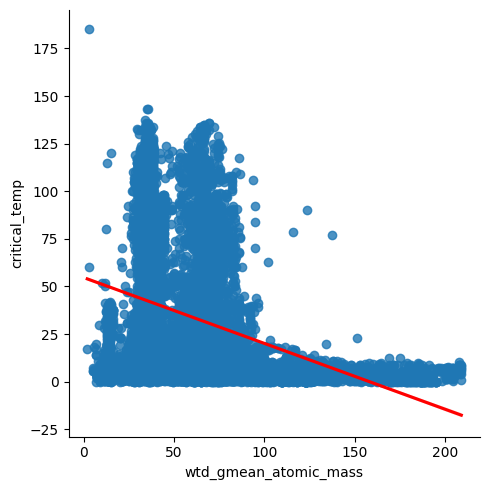

...

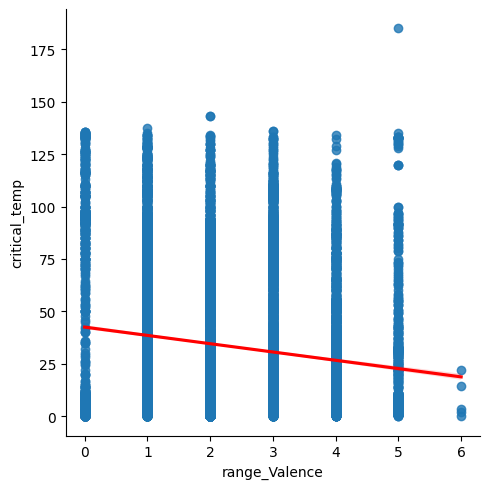

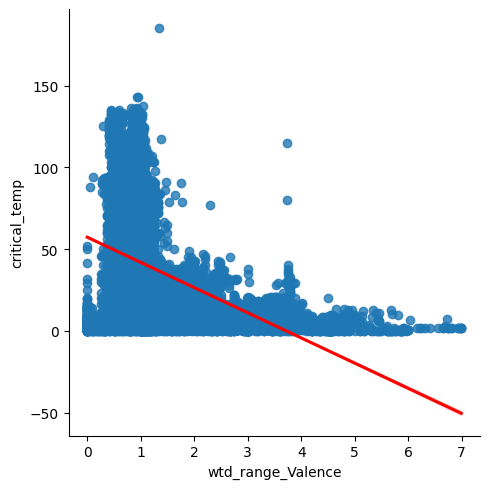

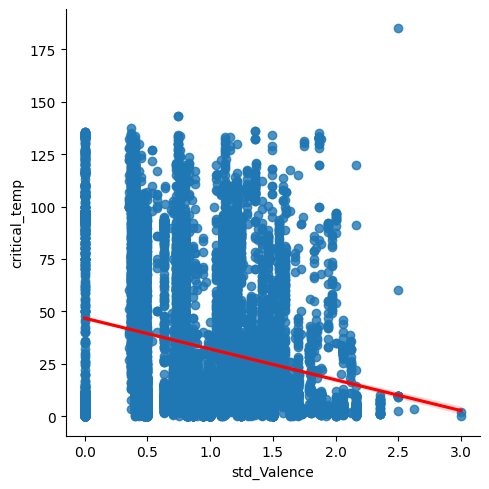

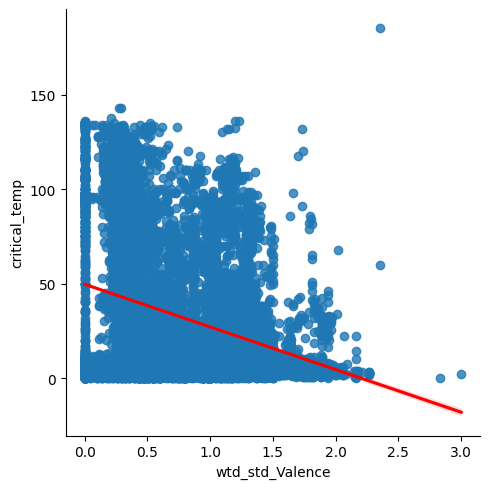

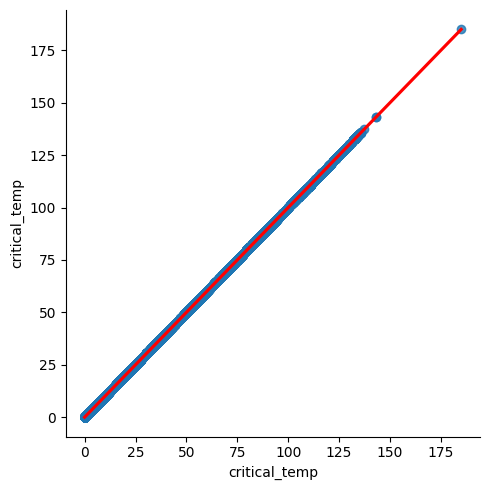

In [57]:
for col in kontinuirane_varijable:
  seaborn.lmplot(x=col, y=ciljna_varijabla, data=train, line_kws={'color': 'red'})

#### 2.4

In [16]:
def zValueCategory(zscore):
  if zscore < -3:
    return -3
  elif zscore > 3:
    return 3
  #print(zscore)
  return 0
  #return zscore

for col in kontinuirane_varijable:
  z_data = pd.DataFrame(stats.zscore(train[col]))
  zscore_cat = z_data[col].map(zValueCategory)
  correlation_matrix = np.corrcoef(zscore_cat, train[ciljna_varijabla])
  correlation = correlation_matrix[0,1]
  print(f"{col} -> korelacija:{correlation:.{5}f}")

<class 'pandas.core.series.Series'>
number_of_elements -> korelacija:0.02908
<class 'pandas.core.series.Series'>
mean_atomic_mass -> korelacija:-0.11183
<class 'pandas.core.series.Series'>
wtd_mean_atomic_mass -> korelacija:-0.14682
<class 'pandas.core.series.Series'>
gmean_atomic_mass -> korelacija:-0.12156
<class 'pandas.core.series.Series'>
wtd_gmean_atomic_mass -> korelacija:-0.14489
<class 'pandas.core.series.Series'>
entropy_atomic_mass -> korelacija:0.10281
<class 'pandas.core.series.Series'>
wtd_entropy_atomic_mass -> korelacija:nan
<class 'pandas.core.series.Series'>
range_atomic_mass -> korelacija:nan
<class 'pandas.core.series.Series'>
wtd_range_atomic_mass -> korelacija:-0.13868
<class 'pandas.core.series.Series'>
std_atomic_mass -> korelacija:nan
<class 'pandas.core.series.Series'>
wtd_std_atomic_mass -> korelacija:nan
<class 'pandas.core.series.Series'>
mean_fie -> korelacija:-0.06087
<class 'pandas.core.series.Series'>
wtd_mean_fie -> korelacija:-0.00222
<class 'pandas.c

c:\Users\Korisnik\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\lib\function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
c:\Users\Korisnik\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\lib\function_base.py:2855: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


gmean_Density -> korelacija:-0.12067
<class 'pandas.core.series.Series'>
wtd_gmean_Density -> korelacija:-0.12713
<class 'pandas.core.series.Series'>
entropy_Density -> korelacija:0.11769
<class 'pandas.core.series.Series'>
wtd_entropy_Density -> korelacija:nan
<class 'pandas.core.series.Series'>
range_Density -> korelacija:0.03420
<class 'pandas.core.series.Series'>
wtd_range_Density -> korelacija:-0.13902
<class 'pandas.core.series.Series'>
std_Density -> korelacija:-0.10579
<class 'pandas.core.series.Series'>
wtd_std_Density -> korelacija:-0.11653
<class 'pandas.core.series.Series'>
mean_ElectronAffinity -> korelacija:-0.09673
<class 'pandas.core.series.Series'>
wtd_mean_ElectronAffinity -> korelacija:-0.06017
<class 'pandas.core.series.Series'>
gmean_ElectronAffinity -> korelacija:-0.10567
<class 'pandas.core.series.Series'>
wtd_gmean_ElectronAffinity -> korelacija:-0.07611
<class 'pandas.core.series.Series'>
entropy_ElectronAffinity -> korelacija:0.10035
<class 'pandas.core.series

#### 2.5 Komentiranje

#### 3.1 IV WoE za svaku var

In [7]:
train['ciljna'] = 'NE'
#<30 su conventional superconductors
#napravljeno koristeci labos
train.loc[train.critical_temp < 30, 'ciljna'] = "DA"
#train['kategorija'] = pd.qcut(train.number_of_elements,4)
#print(type(pd.qcut(train.number_of_elements,4)))
IV_values = {}
first_five_properties = []

for col in sva_svojstva:
    if col != ciljna_varijabla and col != "material":
        print(col + " & " + ciljna_varijabla)
        a = pd.qcut(train[col], 8, duplicates='drop')
        b = train.ciljna

        IV = pd.crosstab(a,b)
        IV['DA'] = IV['DA']/IV['DA'].sum()
        IV['NE'] = IV['NE']/IV['NE'].sum() 
        IV['WoE'] = np.log(IV['DA']/IV['NE'])
        IV['IV'] = (IV['DA']-IV['NE'] * np.log(IV['DA']/IV['NE']))
        print(IV)
        print("------------------------------------------------------------------")
        IV_values[col] = IV['IV'].sum()


number_of_elements & critical_temp
ciljna                    DA        NE       WoE        IV
number_of_elements                                        
(0.999, 2.0]        0.281434  0.008024  3.557409  0.252888
(2.0, 3.0]          0.289327  0.034245  2.134018  0.216248
(3.0, 4.0]          0.205155  0.220276 -0.071114  0.220820
(4.0, 5.0]          0.165928  0.421790 -0.932952  0.559438
(5.0, 6.0]          0.048409  0.233386 -1.573005  0.415527
(6.0, 9.0]          0.009746  0.082278 -2.133224  0.185265
------------------------------------------------------------------
mean_atomic_mass & critical_temp
ciljna                              DA        NE       WoE        IV
mean_atomic_mass                                                    
(6.9399999999999995, 60.332]  0.170036  0.066569  0.937777  0.107610
(60.332, 72.458]              0.125735  0.119688  0.049288  0.119836
(72.458, 76.798]              0.086186  0.188291 -0.781481  0.233332
(76.798, 84.923]              0.091502  0.162862

#### 3.2

wtd_std_ThermalConductivity => 2.46237
wtd_mean_Valence => 2.37616
wtd_gmean_Valence => 2.36634
range_ThermalConductivity => 2.24267
wtd_gmean_FusionHeat => 2.22332


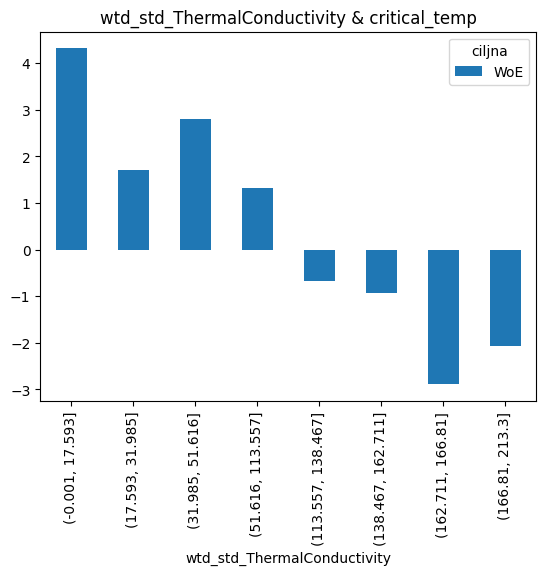

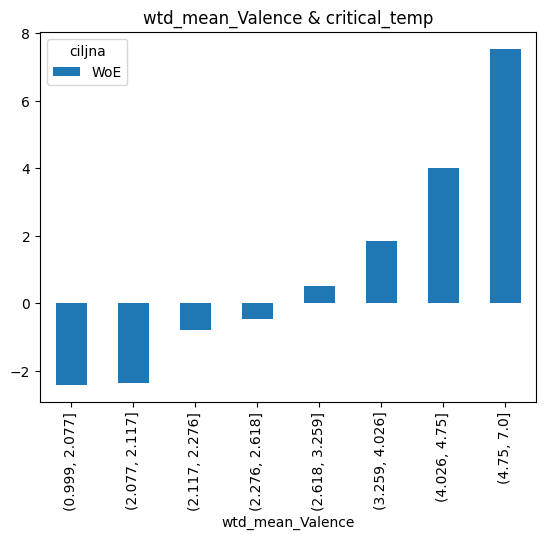

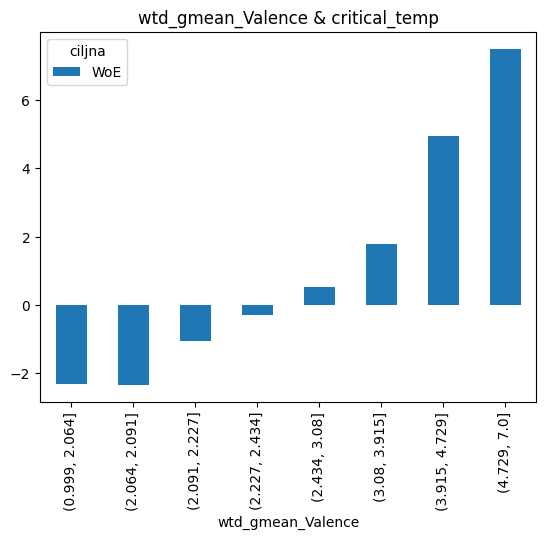

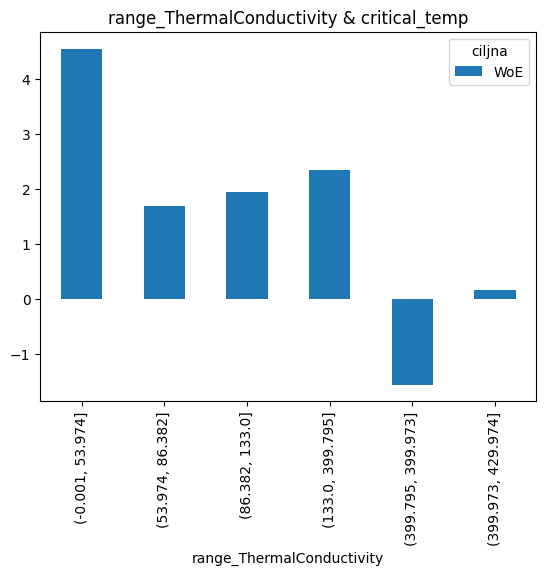

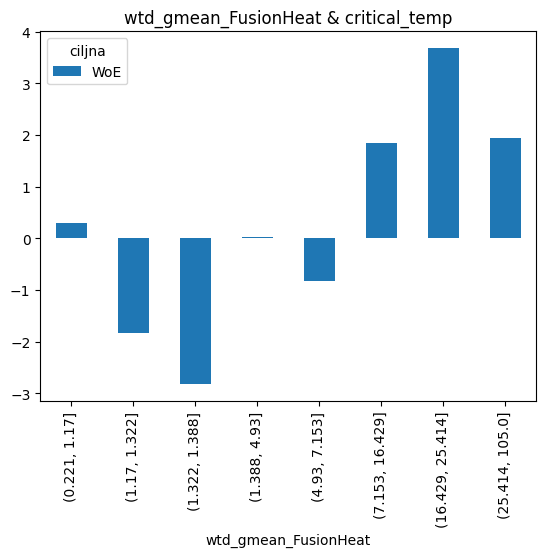

In [9]:
first_five_IVs = sorted(IV_values.items(), key=lambda item: item[1], reverse=True)[:5]
for col in first_five_IVs:
    property_name, value = col
    first_five_properties.append(property_name)
    print(f"{property_name} => {value:.{5}f}")

for col in first_five_properties:
    a = pd.qcut(train[col], 8, duplicates='drop')
    b = train.ciljna

    IV = pd.crosstab(a,b)
    IV['DA'] = IV['DA']/IV['DA'].sum()
    IV['NE'] = IV['NE']/IV['NE'].sum() 
    IV['WoE'] = np.log(IV['DA']/IV['NE'])
    IV['IV'] = (IV['DA']-IV['NE'] * np.log(IV['DA']/IV['NE']))

    title = col + " & " + ciljna_varijabla

    IV[['WoE']].plot(kind='bar', title=title)
    plt.show()

#### 3.3

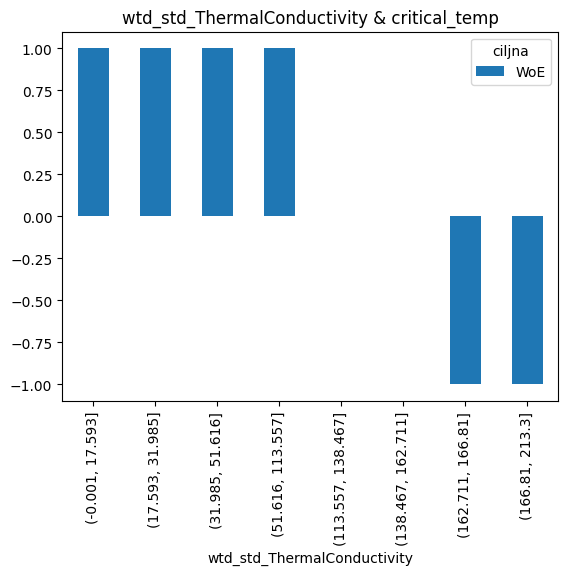

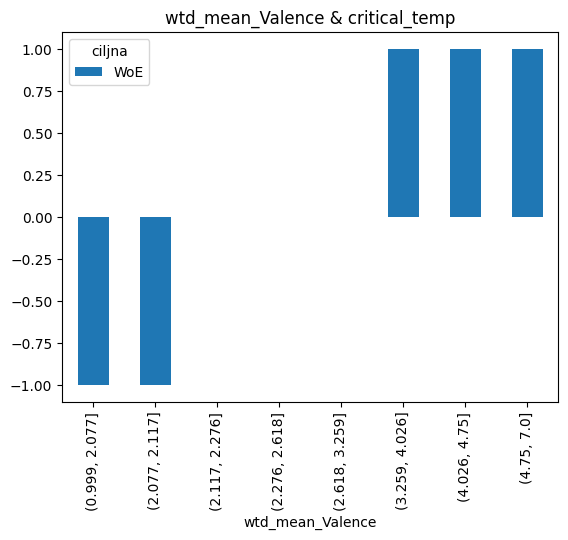

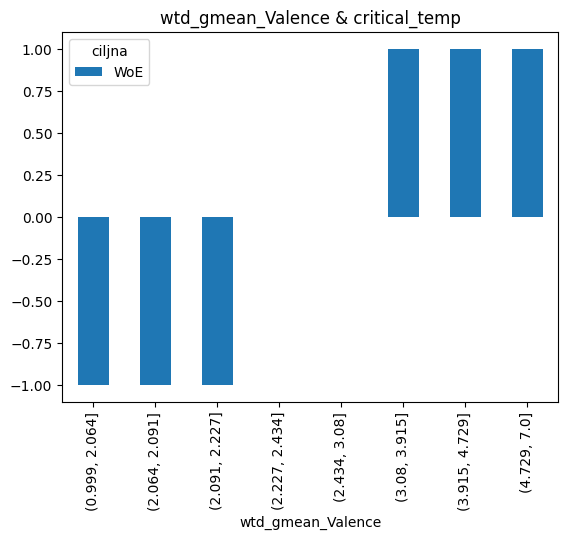

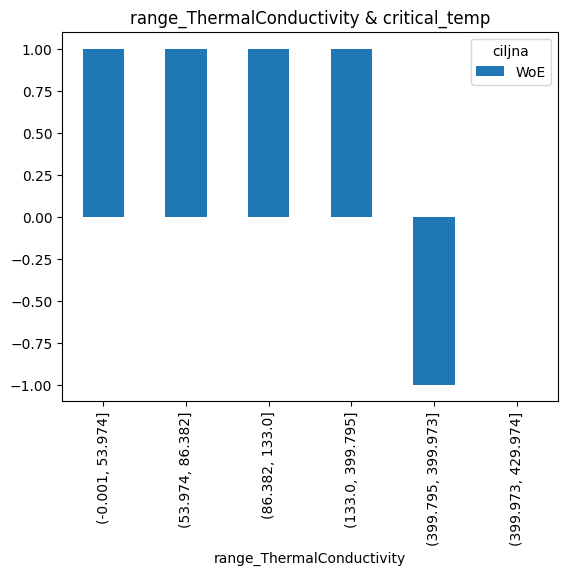

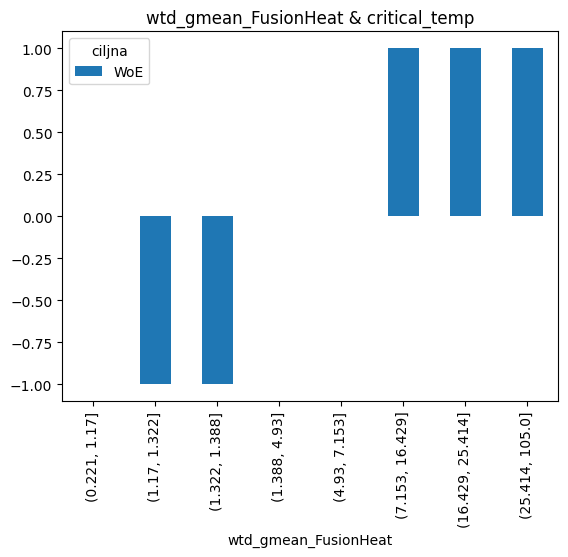

In [19]:
def woeCategory(woe_score):
  if woe_score < -1:
    return -1
  elif woe_score > 1:
    return 1
  return 0

for col in first_five_properties:
    a = pd.qcut(train[col], 8, duplicates='drop')
    b = train.ciljna

    IV = pd.crosstab(a,b)
    IV['DA'] = IV['DA']/IV['DA'].sum()
    IV['NE'] = IV['NE']/IV['NE'].sum() 
    IV['WoE'] = np.log(IV['DA']/IV['NE']).map(woeCategory)

    title = col + " & " + ciljna_varijabla
    IV[['WoE']].plot(kind='bar', title=title)
    plt.show()